In [1]:
import numpy as np 
import geopandas as gpd 
import matplotlib.pyplot as plt 
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors
import pandas as pd 
from shapely.geometry import shape 
# from shapely.geometry import Polygon 
import json 
from shapely import wkt 
from shapely.geometry import box
from math import cos, radians
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.cm import ScalarMappable
import seaborn as sns 
import contextily as ctx
import xarray as xr
from pathlib import Path
from shapely.geometry import Polygon, Point

# NASA FIRMS US/CANADA

https://firms.modaps.eosdis.nasa.gov/usfs/map/#d:24hrs;@-100.0,40.0,4.0z

FIRMS US/Canada (Fire Information for Resource Management System US/Canada) is a joint effort by NASA and the USDA Forest Service to provide access to low latency satellite imagery and science data products from Earth Observation System (EOS) satellite assets to identify the location, extent and intensity of wildfire activity and its effects.

The five satellite dataset are available daily: MODIS, VIIRS S-NPP, VIIRS NOAA-20, VIIRS NOAA-21, and LANDSAT. The LANDSAT has 30-m resolution while MODIS has 1-km resolution. All VIIRS satellites have 375-m grid size.

We download the data during 2025 LA fire happened in Palisades and Eaton during the early January.

### Load the Landsat data [30m] from Jan 6 to Jan 12

In [2]:
landsat_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_LS_585434/fire_nrt_LS_585434.shp")

In [3]:
la_bounds = {
    "minx": -118.7, "maxx": -118.0,  # Longitude range
    "miny": 33.7, "maxy": 34.3       # Latitude range
}

# Filter the dataset to keep only the region of LA
landsat_gdf_la = landsat_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

### Clip to the fire perimeter

In [4]:
fire_perimeter = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/fires_perimeter.geojson")
fire_perimeter

,mission_group,OBJECTID,GlobalID,type,source,poly_DateCurrent,mission,incident_name,incident_number,area_acres,...,PercentPerimToBeContained,ModifiedBySystem2,sourceoid,websiteId,websiteDbId,dataverseId,displayStatus,Shape__Area,Shape__Length,geometry
0,Eaton,1269,ea6b6983-73b6-49fa-b467-1081579fb284,Heat Perimeter,FIRIS,2025-01-09 02:29:10.844,CA-LAC-EATON-N57B,Eaton,72660adc-b5ef-4d96-a33f-b4ea3740a4e3,10589.956010,...,None,None,None,dbfa574e-1b10-4467-b5e5-7d1c06ebc8dc,4319,2b91dbc1-79cd-ef11-b8e9-001dd804aa64,Inactive,0.004192,0.818015,"MULTIPOLYGON (((-118.15647 34.18125, -118.1564..."
1,Palisades,1264,0bc1ddb3-63bf-4fd8-a01b-d522f57e4083,Heat Perimeter,FIRIS,2025-01-07 23:17:39.000,CA-LFD-PALISADES-N57B,Palisades,,1261.520779,...,None,None,None,abfed7a3-794a-4294-9852-43176dcbc18a,4318,f0a2f70e-2dcd-ef11-b8e9-001dd804aa64,Active,0.000499,0.342099,"MULTIPOLYGON (((-118.56728 34.04256, -118.5672..."


In [5]:
landsat_gdf_la = landsat_gdf_la.to_crs(fire_perimeter.crs)

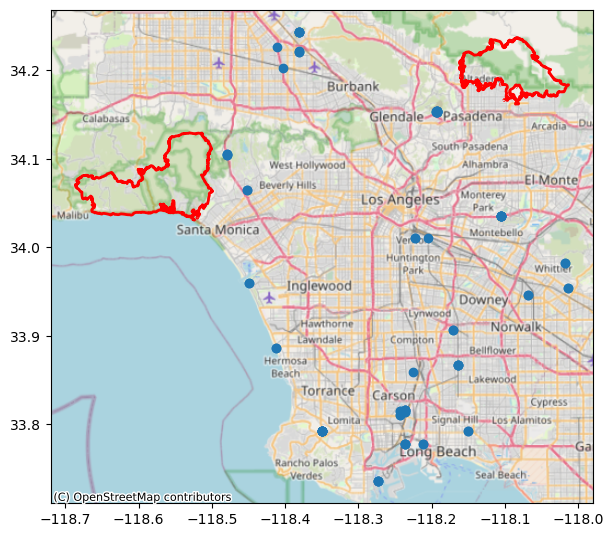

In [6]:
f,ax=plt.subplots(figsize=(7,10))

landsat_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

#### Ops, no data from landsat
### Load the MODIS data [1KM] from Jan 6 to Jan 12

In [7]:
modis_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_M-C61_585433/fire_nrt_M-C61_585433.shp")

In [8]:
# Filter the dataset to keep only the region of LA
modis_gdf_la = modis_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

In [9]:
modis_gdf_la = modis_gdf_la.to_crs(fire_perimeter.crs)

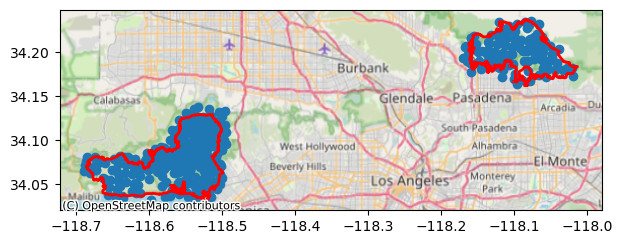

In [13]:
f,ax=plt.subplots(figsize=(7,10))

modis_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

In [14]:
modis_eaton = modis_gdf_la.clip(fire_perimeter.geometry.iloc[0])
modis_palisades = modis_gdf_la.clip(fire_perimeter.geometry.iloc[1])

### Load the S-NPP VIIRS data [375 M] from Jan 6 to Jan 12

In [15]:
sv_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_SV-C2_585437/fire_nrt_SV-C2_585437.shp")

In [16]:
# Filter the dataset to keep only the region of LA
sv_gdf_la = sv_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

In [17]:
sv_gdf_la = sv_gdf_la.to_crs(fire_perimeter.crs)

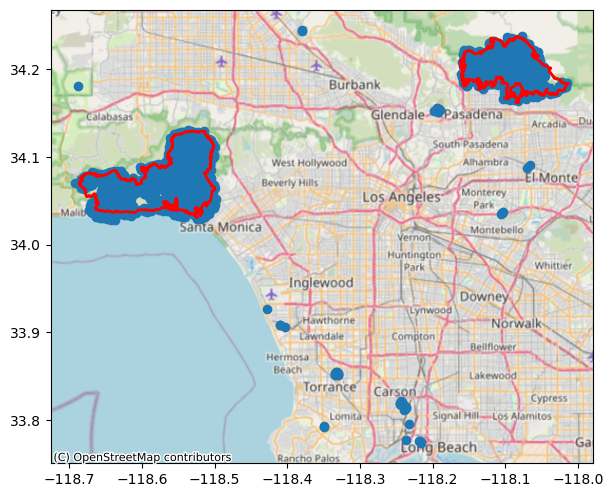

In [18]:
f,ax=plt.subplots(figsize=(7,10))

sv_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=landsat_gdf_la.crs)

In [19]:
sv_eaton = sv_gdf_la.clip(fire_perimeter.geometry.iloc[0])
sv_palisades = sv_gdf_la.clip(fire_perimeter.geometry.iloc[1])

### Load the JPSS NOAA-20 VIIRS data [375 M] from Jan 6 to Jan 12

In [20]:
j1_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_J1V-C2_585435/fire_nrt_J1V-C2_585435.shp")

In [21]:
# Filter the dataset to keep only the region of LA
j1_gdf_la = j1_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

In [22]:
j1_gdf_la = j1_gdf_la.to_crs(fire_perimeter.crs)

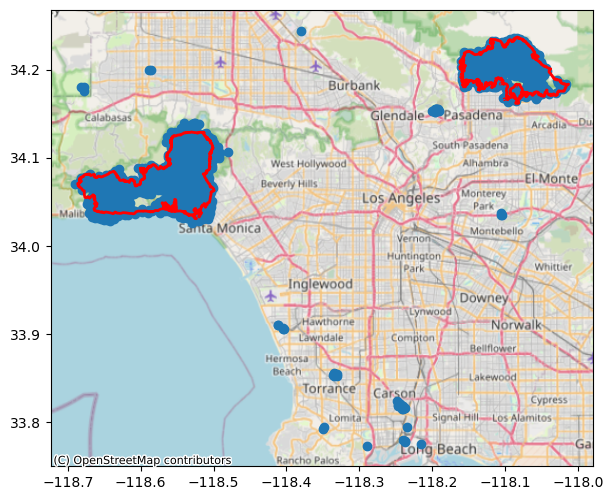

In [23]:
f,ax=plt.subplots(figsize=(7,10))

j1_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

In [24]:
j1_eaton = j1_gdf_la.clip(fire_perimeter.geometry.iloc[0])
j1_palisades = j1_gdf_la.clip(fire_perimeter.geometry.iloc[1])

### Load the JPSS NOAA-21 VIIRS data [375 M] from Jan 6 to Jan 12

In [26]:
j2_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_J2V-C2_585436/fire_nrt_J2V-C2_585436.shp")

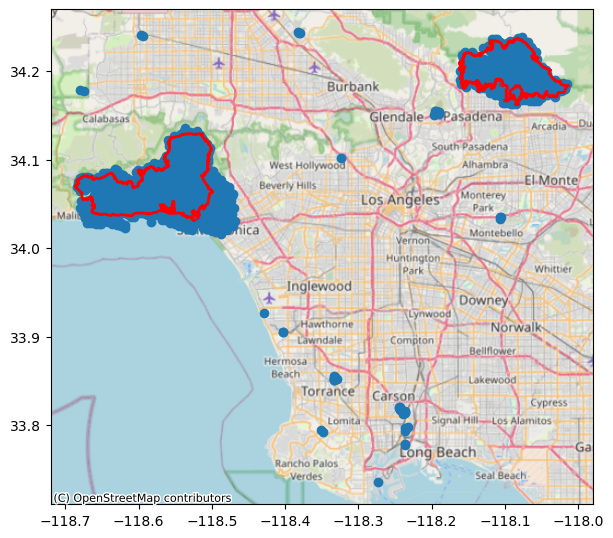

In [27]:
# Filter the dataset to keep only the region of LA
j2_gdf_la = j2_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

j2_gdf_la = j2_gdf_la.to_crs(fire_perimeter.crs)

f,ax=plt.subplots(figsize=(7,10))

j2_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

In [28]:
j2_eaton = j2_gdf_la.clip(fire_perimeter.geometry.iloc[0])
j2_palisades = j2_gdf_la.clip(fire_perimeter.geometry.iloc[1])

## Merge all available data to one dataset for each region

In [29]:
for gdf in [j1_eaton, j1_palisades, j2_eaton, j2_palisades, modis_eaton, modis_palisades, sv_eaton, sv_palisades]:
    gdf.loc[:, "ACQ_DATE"] = pd.to_datetime(gdf["ACQ_DATE"])

In [31]:
merged_eaton_gdf = gpd.GeoDataFrame(pd.concat([j1_eaton, j2_eaton, modis_eaton, sv_eaton], ignore_index=True))
merged_palisades_gdf = gpd.GeoDataFrame(pd.concat([j1_palisades, j2_palisades, modis_palisades, sv_palisades], ignore_index=True))

# Sort by time
merged_eaton_gdf = merged_eaton_gdf.sort_values(by="ACQ_DATE").reset_index(drop=True)
merged_palisades_gdf = merged_palisades_gdf.sort_values(by="ACQ_DATE").reset_index(drop=True)

#### Visualize the daily change

We use FRP, which depicts the pixel-integrated fire radiative power in megawatts (MW).

(0.0, 50.0)

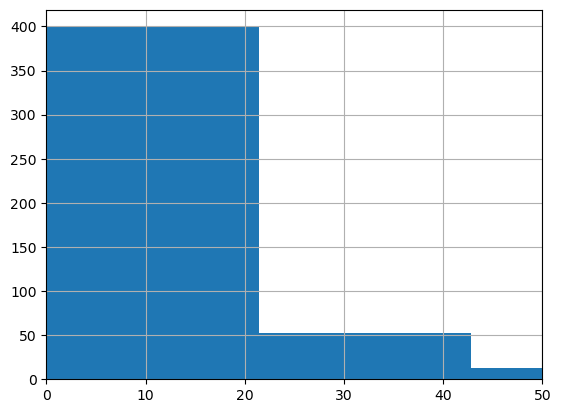

In [49]:
merged_eaton_gdf[merged_eaton_gdf['ACQ_DATE'] == unique_dates[1]].FRP.hist(bins= 50)
plt.xlim([0,50])

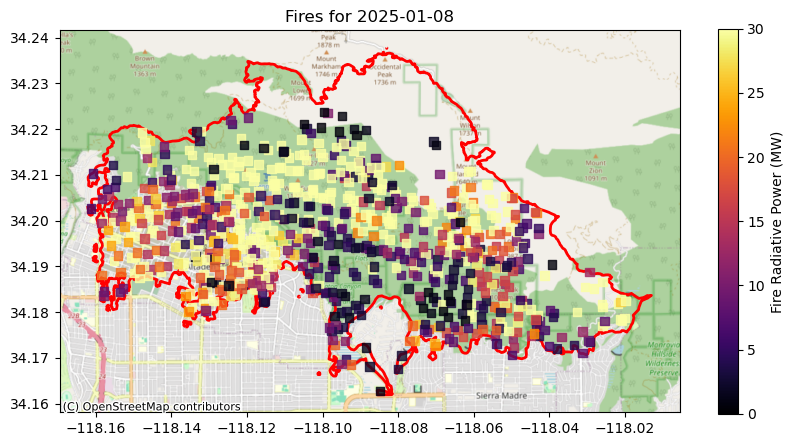

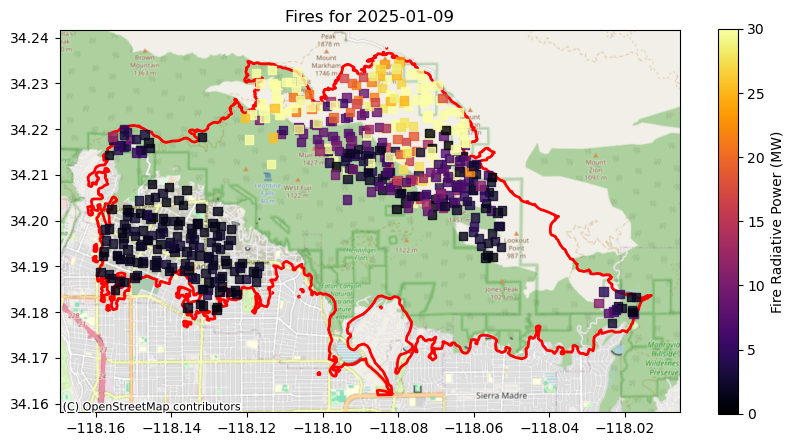

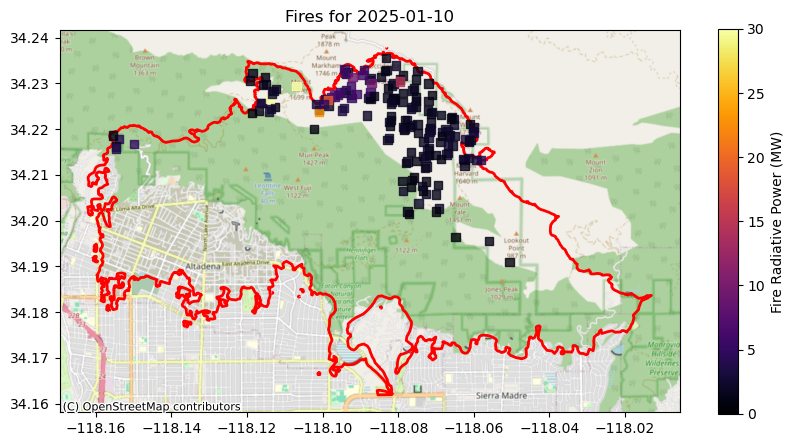

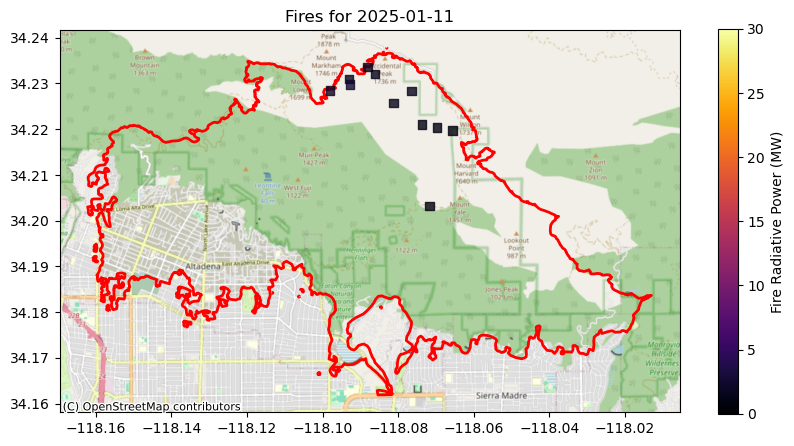

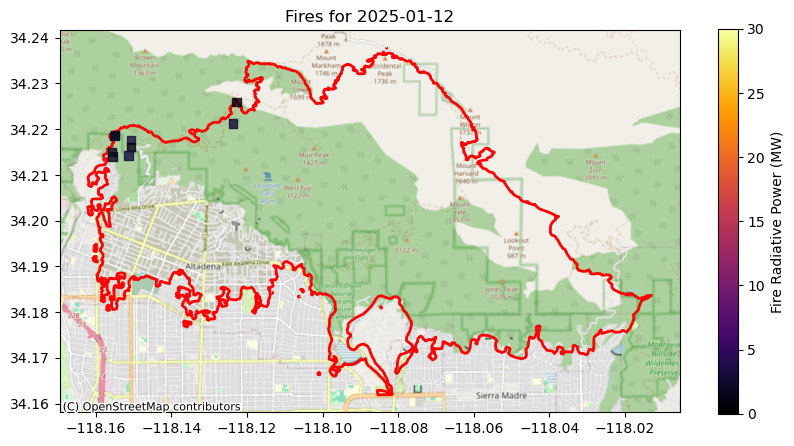

In [68]:
unique_dates = merged_eaton_gdf['ACQ_DATE'].unique()

# Loop through each unique date and plot
for date in unique_dates:
    day_data = merged_eaton_gdf[merged_eaton_gdf['ACQ_DATE'] == date]
    
    fig, ax = plt.subplots(figsize=(10, 5))
    gpd.GeoSeries(fire_perimeter.geometry.iloc[0]).plot(ax=ax, edgecolor="red", facecolor="none", linewidth=2)   
    day_data.plot(ax=ax, column='FRP', cmap='inferno',
                  alpha=0.8, vmin=0, vmax=30, legend=True, marker='s', legend_kwds={'label':'Fire Radiative Power (MW)'})
    
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

    date_str = date.strftime('%Y-%m-%d')
    ax.set_title(f"Fires for {date_str}")
    plt.show()


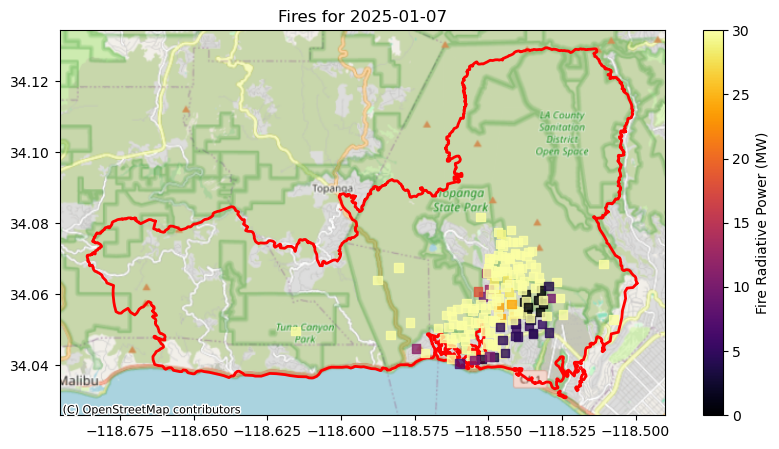

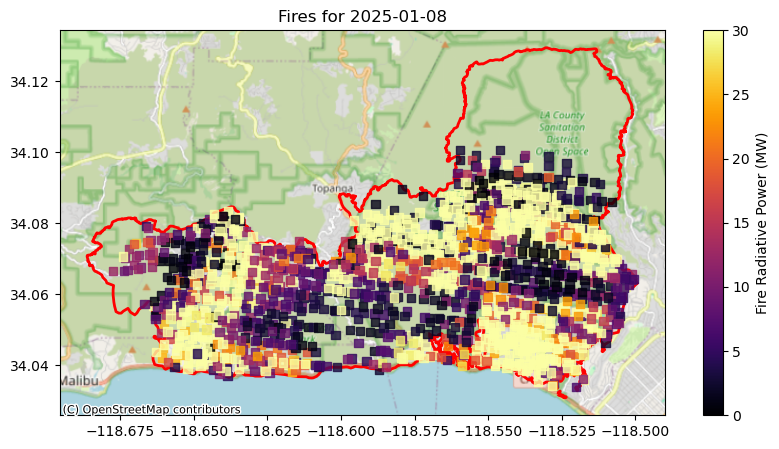

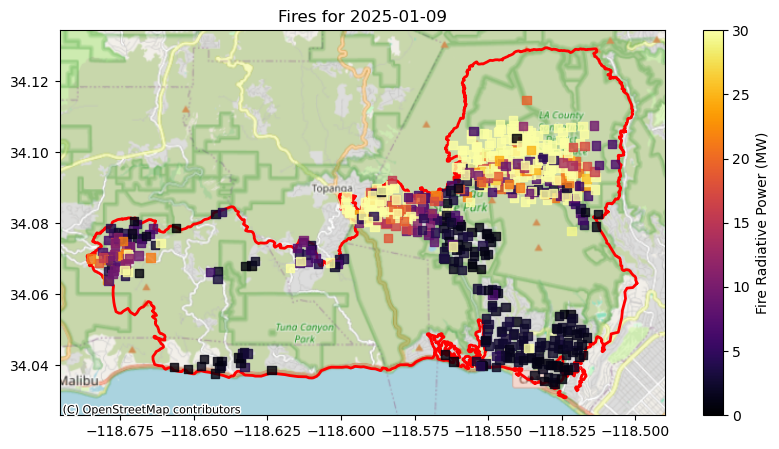

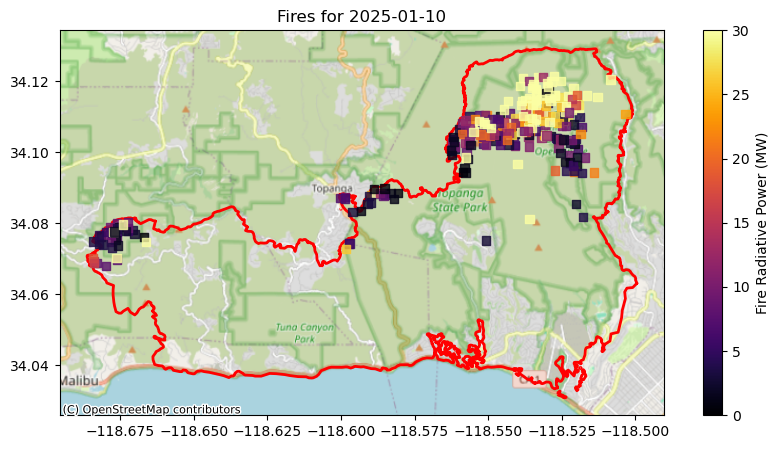

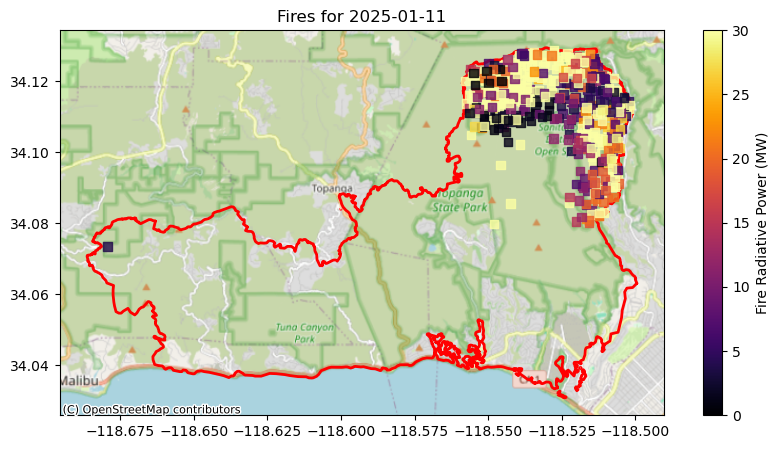

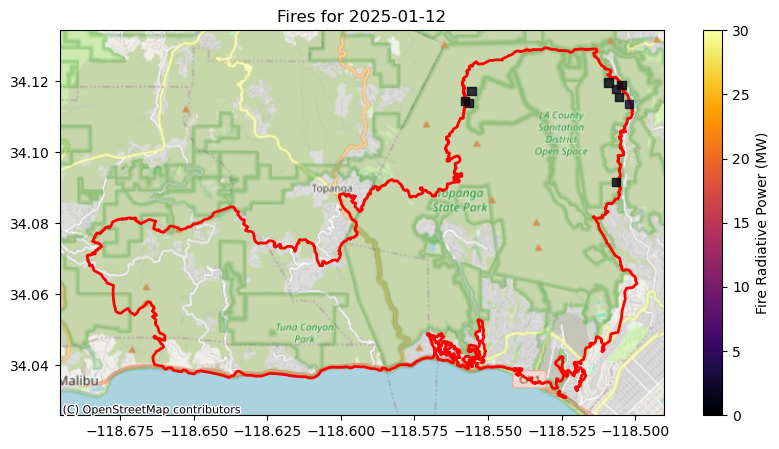

In [69]:
unique_dates = merged_palisades_gdf['ACQ_DATE'].unique()

# Loop through each unique date and plot
for date in unique_dates:
    day_data = merged_palisades_gdf[merged_palisades_gdf['ACQ_DATE'] == date]
    
    fig, ax = plt.subplots(figsize=(10, 5))
    gpd.GeoSeries(fire_perimeter.geometry.iloc[1]).plot(ax=ax, edgecolor="red", facecolor="none", linewidth=2)
    day_data.plot(ax=ax, column='FRP', cmap='inferno', 
                  alpha=0.8, vmin=0, vmax=30, legend=True, marker='s', legend_kwds={'label':'Fire Radiative Power (MW)'})
    
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

    date_str = date.strftime('%Y-%m-%d')
    ax.set_title(f"Fires for {date_str}")
    plt.show()


### Use matpolib hexbin plot

But need to reproject to equal-distance projection method. We use Web Mercator (EPSG:3857) for proper plotting here.

In [62]:
def plot_hexbin_fires(gdf, date, ID, gridsize=40, cmap="inferno"):

    daily_gdf = gdf[gdf["ACQ_DATE"] == date]

    x = daily_gdf.geometry.x
    y = daily_gdf.geometry.y
    frp = daily_gdf["FRP"]

    # Plot hexbin
    fig, ax = plt.subplots(figsize=(10, 5))
    hb = ax.hexbin(x, y, C=frp, gridsize=gridsize, cmap=cmap, reduce_C_function=np.mean, vmin=0, vmax=40)

    cb = plt.colorbar(hb, ax=ax)
    cb.set_label("Mean Fire Radiative Power (FRP)")

    gpd.GeoSeries(fire_perimeter.geometry.iloc[ID]).plot(ax=ax, edgecolor="red", facecolor="none", linewidth=2)
    
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=daily_gdf.crs)

    date_str = date.strftime('%Y-%m-%d')
    ax.set_title(f"Fire Intensity on {date_str}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    plt.show()


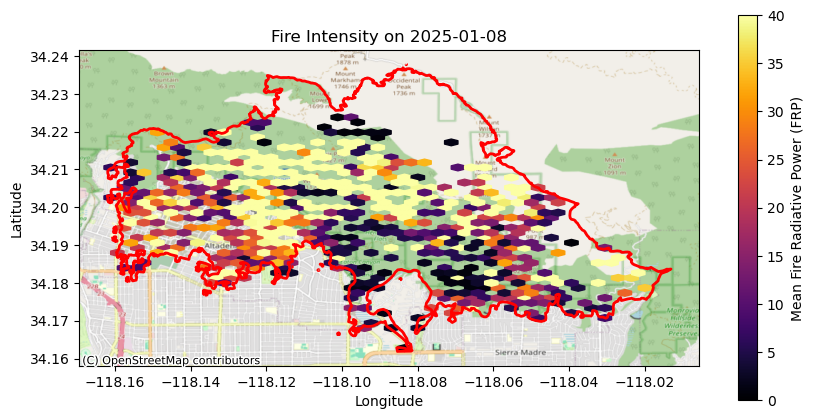

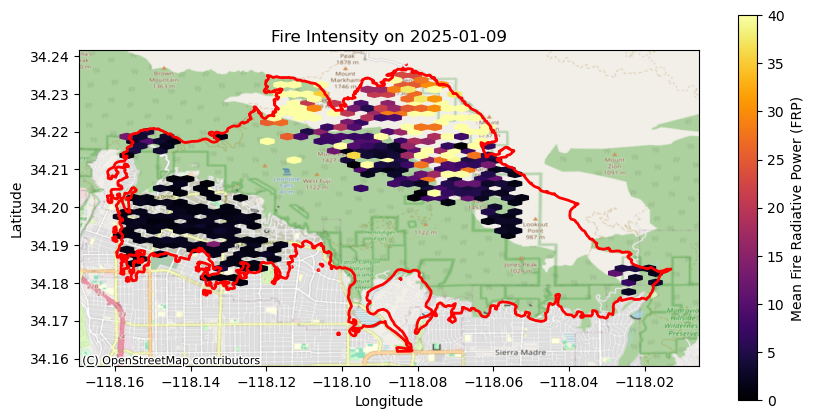

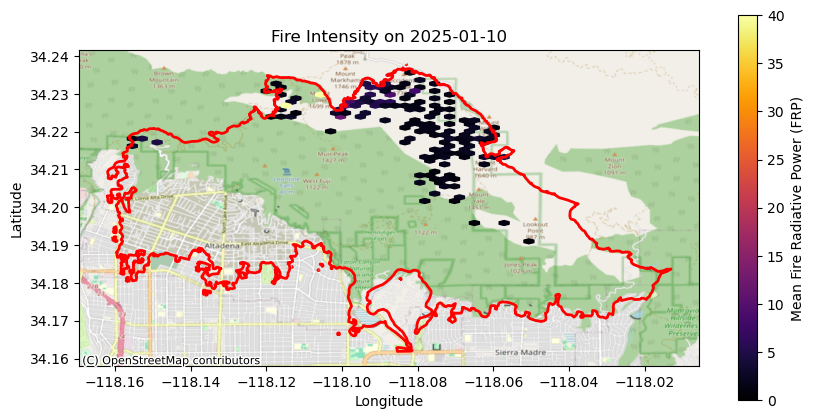

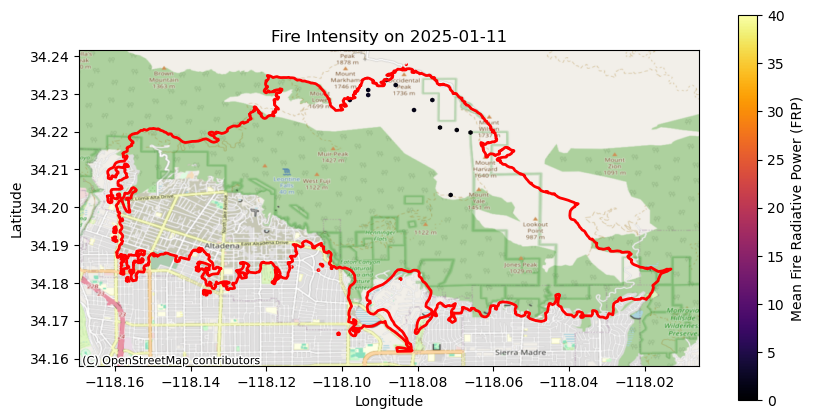

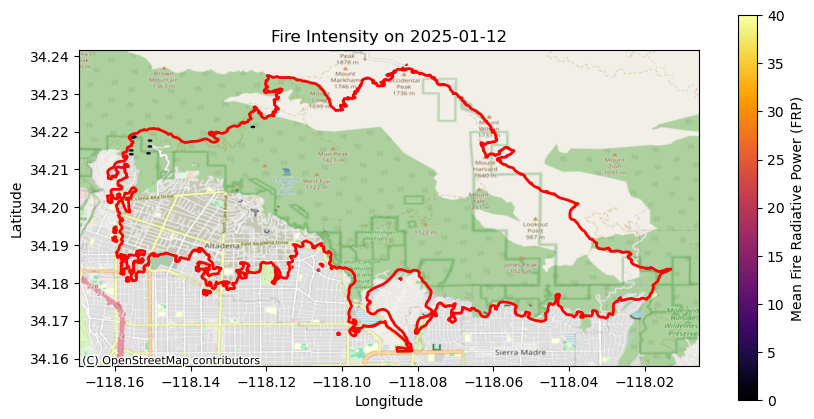

In [63]:
unique_dates = merged_eaton_gdf["ACQ_DATE"].unique()

for date in unique_dates:
    plot_hexbin_fires(merged_eaton_gdf, date, 0)

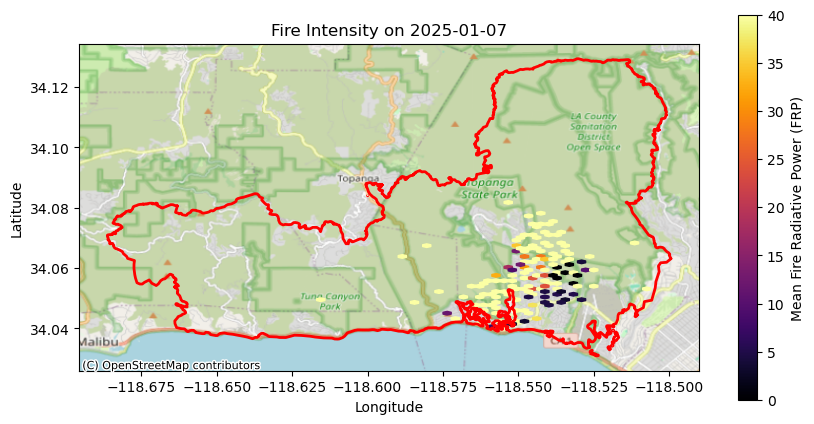

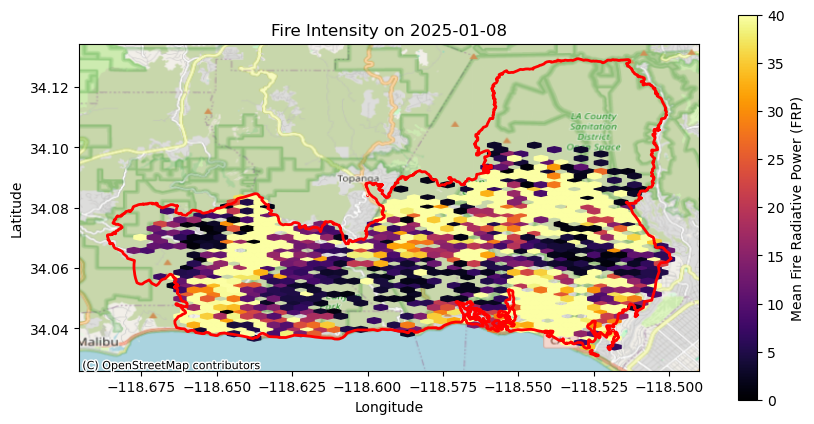

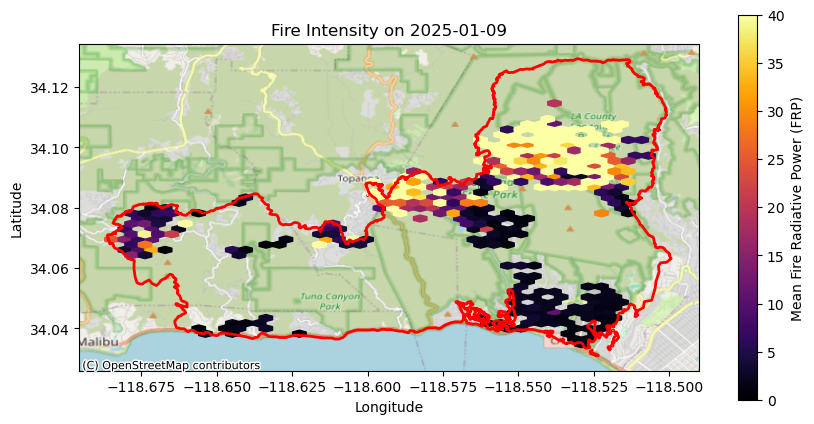

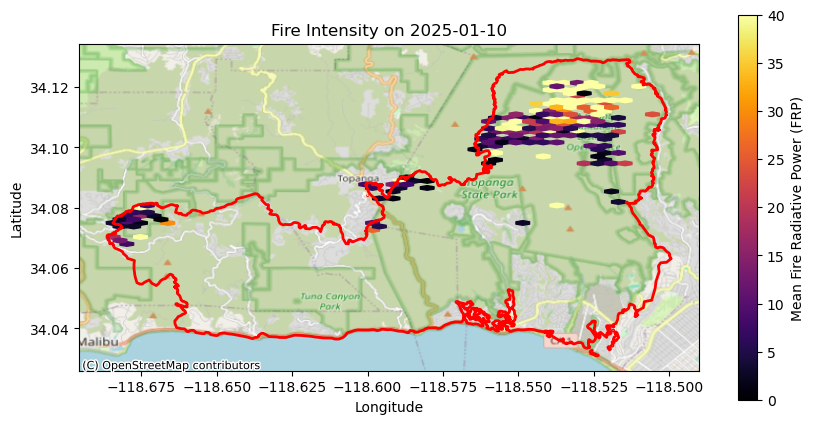

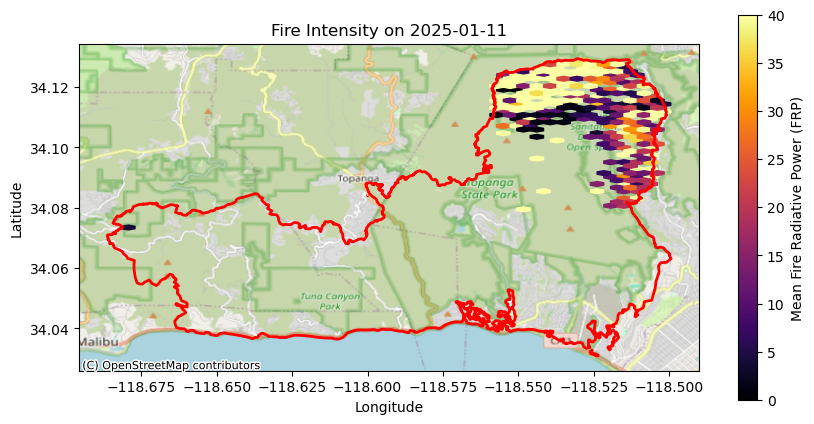

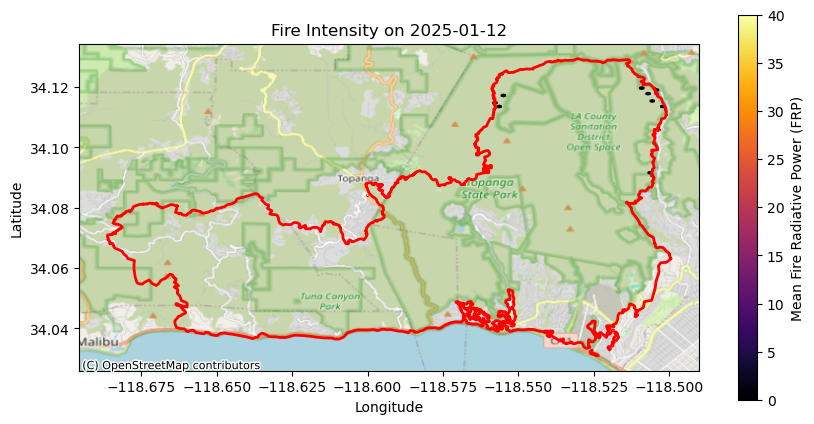

In [64]:
unique_dates = merged_palisades_gdf["ACQ_DATE"].unique()

for date in unique_dates:
    plot_hexbin_fires(merged_palisades_gdf, date, 1)